<a href="https://colab.research.google.com/github/mohammedkhizarf/Bulldozer-auction-price-prediction-project/blob/main/Dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TenserFlow 2.0 and TenserFlow Hub.



## 1. Problem

Identifying the breed of a dog given an image of an dog.

When I'm sitting at the cafe and i take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's Dog Breed Identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

##  4. Features

Some Information about the data:
* we are dealing with images(Unstructured data), So its probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(This means there are 120 different classes).
* There are around 10,000+ images in the training set(This images have labels).
* There are around 10,000+ images in the test set(This image has No labes, As we have to predict them).



### Get our workspace ready

In [ ]:
# Import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
import keras
print("Tf_version :", tf.__version__)
print("TF Hub Version :", hub.__version__)





Tf_version : 2.18.0
TF Hub Version : 0.16.1


In [ ]:

!pip install tensorflow==2.14 tensorflow-hub==0.15

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.3 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: tensorflow-hub
    Found existing installation: tensorflow-hub 0.16.1
    Uninstalling tensorflow-hub-0.16.1:
      Successfully uninstalled tensorflow-hub-0.16.1
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.

In [ ]:
#!unzip "drive/MyDrive/Dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog-vision"

## Getting our data ready (Turning into Tensors)

With all machine learning models, our data has to be in  numrical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head() )

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed

labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

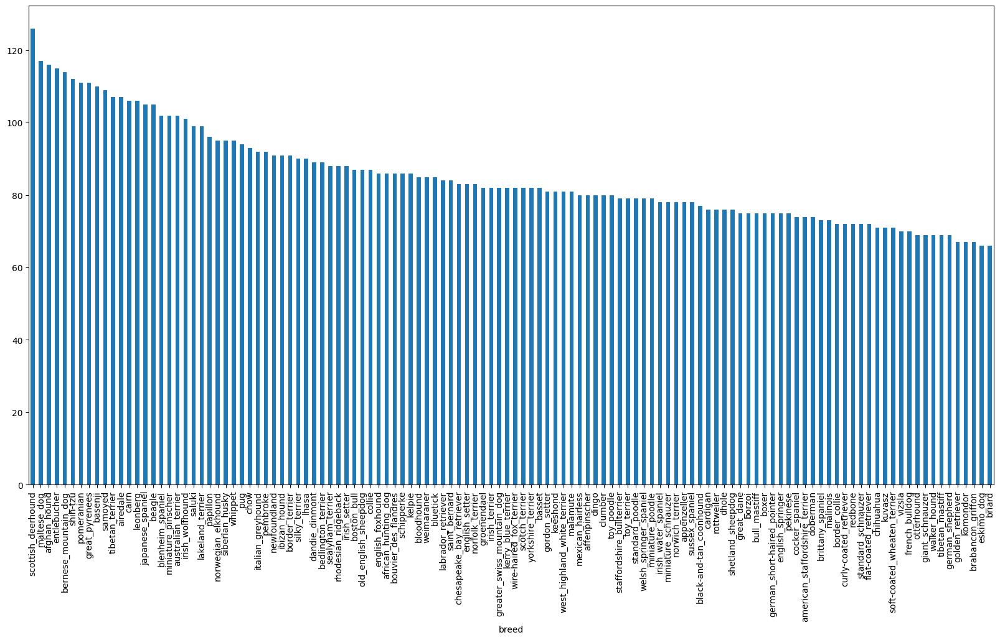

In [ ]:
# Lets plot it

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

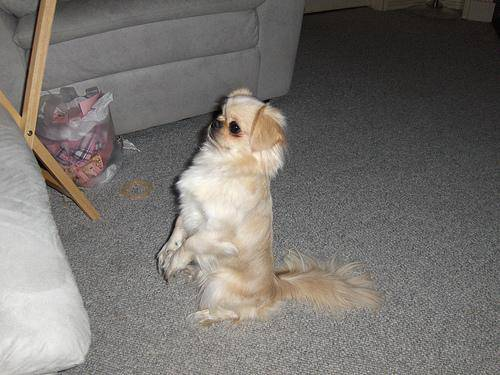

In [ ]:
# Let's view an image

from IPython.display import Image
Image("drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels

Let's get a list og all our image file pathnames.

In [ ]:
# Create pathnames for image IDs

filenames = ["drive/MyDrive/Dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether the number of filenames match number of actual image files.

import os
if len(os.listdir("drive/MyDrive/Dog-vision/train/")) == len(filenames):
  print("Filenames match actual image files")
else:
  print("Filenames do not match actual image files")

Filenames match actual image files


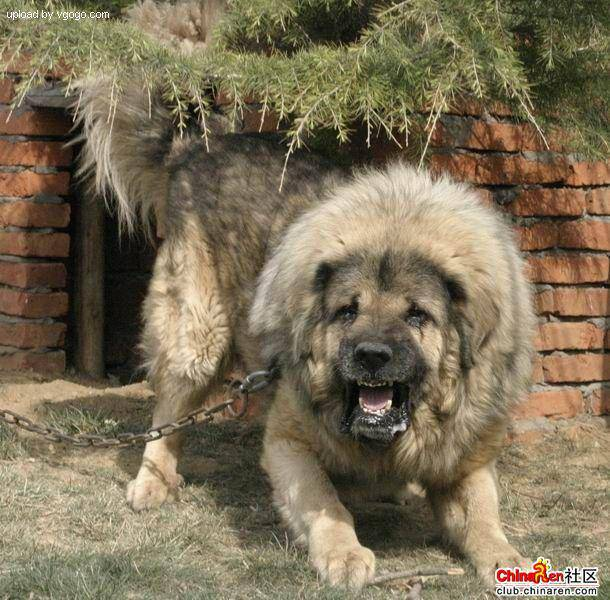

In [ ]:
# Image check

Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have now got our traning image filepaths in a list, Let's prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)   #Another method to be known if needed, but gives same array as result
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames

if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the uniques label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array

boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers

print(labels[0]) # original labels
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be an 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from kaggle dosen't comes with a validation set, We'r going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(x)

10222

We are going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set a number of image to use for experimenting

NUM_IMAGES = 1000 #@param {type: "slider",min: 1000, max: 10000, step:1000  }

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

In [ ]:
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (Turning images into Tensors)

To prepare our images into Tensors we'r going to write a function which does a few things :
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (Convert colour channels values from 0-255 to 0-1)
5. Resize the `image` to be shape of (244, 244)
6. Return the modified `image`

Before we do, Let's see what importing an image looks like

In [ ]:
# Convert image into NumPy arrary
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
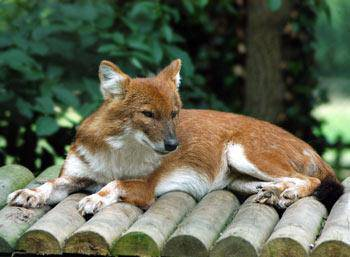

In [ ]:
image

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Lets build the function now

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a funtion for preprocessing image
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches

Let's say you are trying to process 10,000+ images in one go.... They all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needed).

In order to use TensorFlow effectively, we need our data in the fom of Tensor tupels which looks like this:
`(image, label)`

In [ ]:
# Create a simle function to return a tuple(image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosiated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]) )


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way turn our data into tuples of Tensors in the form: `(image, label)`. Let's make a function to turn all our data into (`x` & `y`) into batches!.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),   #filepaths
                                               tf.constant(y)))  #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))

    #Suffling pathnames and labels before mapping image processor function is faster than shuffling images.
    data = data.shuffle(buffer_size=len(x))

    #Create (image, label) tupils (this also turns the imagepath into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch




In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

Our data is now in batches, To understand it better,Let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels) :
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10.5,10.5))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
  # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
  # Turn the gridline off
    plt.axis("off")

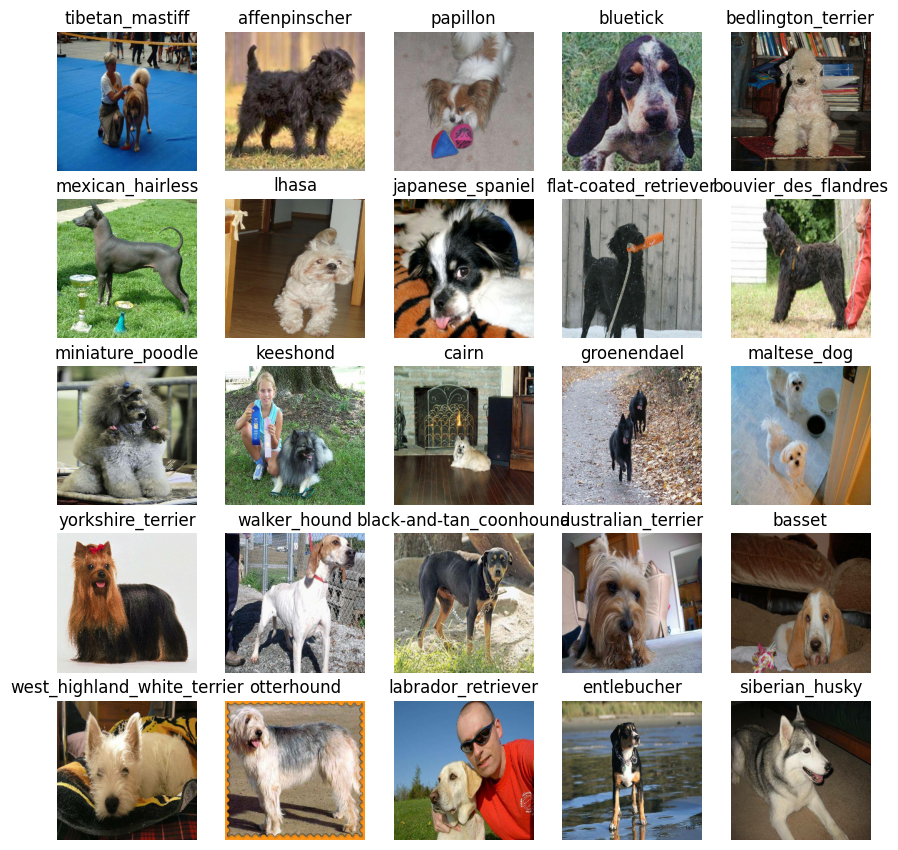

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

# Now let's visualize the data in the training batch
show_25_images(train_images, train_labels)

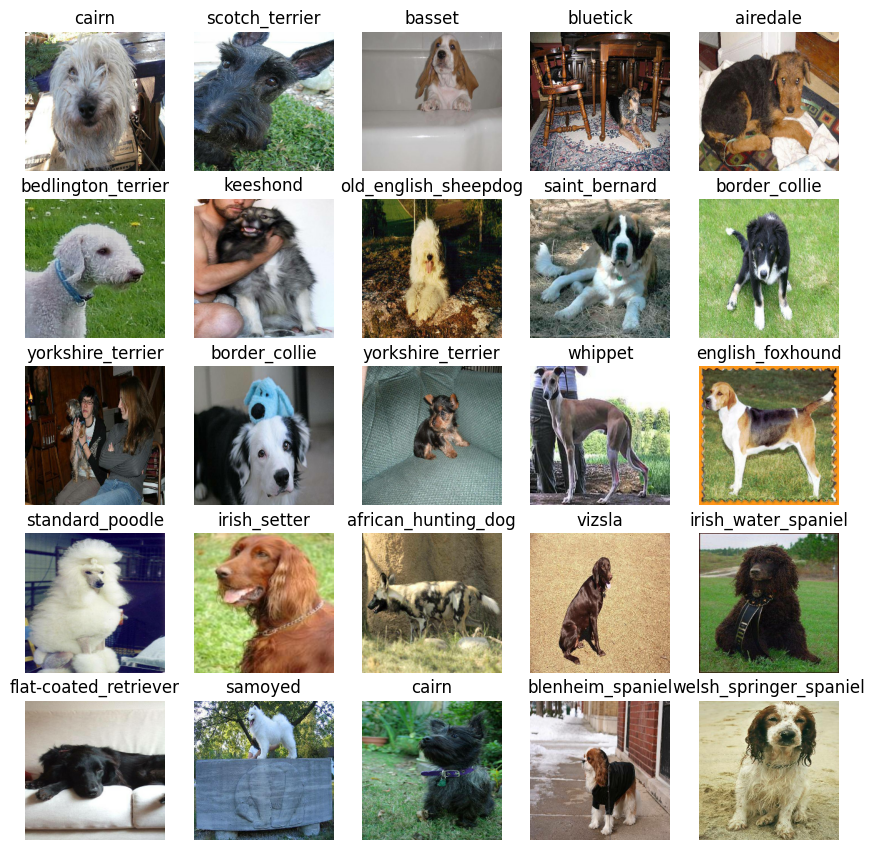

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

# https://tfhub.dev/google/imagenet/mobilent_v2_130_244/classification/4


Now we have got our inputs, outputs and model ready to go.
Let's put them together into Keras deep learning model !

Knowing this let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in Keras model in sequential fashion (Do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tellsthe model input shape it will be getting).
* Returns the model.


In [ ]:
# Crate a function that builds a keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])


  # Complie the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creatring Callbacks

Callbacks are helper funtions a model can use during training to do such things as save its progress, check its progres or stop model training early if a model stops improving.

We will create two callbacks, one for Tensorboard which helps track our models progress and another for early stopping which prevents our model from training for two long.

### TensorBoard callback

To setup a tensorboard callback, we nned to do 3 things.

1. Load the TensorBoard notebook extension
2. Create a Tensorboard callback which is able save to logs to a directory and pass it to our model's `fit()` fucntion.
3. Visualize our models training logs with the %tensorboard magic function (after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

# Create a function to build a tensotboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join('drive/MyDrive/Dog-vision/logs',
                        # Make it so the logs get tracked whenever we run an expreiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

tensorboard = create_tensorboard_callback()

### Early stopping

Early stopping helps to stop our model from overfitting by stopiing if a certain value metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure it's working

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

Let's creste a function which trains a model

Create a model using create_model()
Setup a Tensorboard callback using create_tensorboard_callback()
Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we like to use
Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a  mode
  model = create_model()

  # crete a new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model


In [ ]:
# Fit the model to the data
model = train_model()
model

Looks like our model is overfitting as we can see that it's performing way better on training data than validation data we'll use some ways to prevent overfitting

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize contents


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
val_data

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

In [ ]:
# First prediction
index = 56
print(predictions[0])
print(f'max value (probability of prediction: {np.max(predictions[index])}')
print(f'sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')


[9.82292346e-04 8.83029206e-05 6.01377396e-04 3.79027566e-04
 8.35530664e-05 1.29041713e-04 6.22495031e-03 3.24339094e-03
 3.90280882e-04 4.13275673e-04 1.50109455e-03 4.32725210e-04
 5.58623346e-04 2.00359253e-04 9.90542932e-04 1.31515646e-03
 5.17766239e-05 1.55519173e-01 4.46443028e-06 7.35815556e-05
 7.74837914e-04 1.60927171e-04 5.83085348e-05 6.57711877e-04
 1.55807371e-04 2.33827333e-04 6.10309206e-02 8.71967059e-05
 1.04262517e-03 1.61079864e-04 1.42364472e-04 1.25564216e-03
 7.12718989e-04 5.42209818e-05 4.00785386e-04 1.50162969e-02
 1.28351166e-04 8.26904550e-04 1.92626190e-04 1.48266205e-04
 1.29738904e-03 1.56854949e-05 1.09206580e-04 1.65460806e-04
 5.09946622e-05 6.82454323e-04 1.99531307e-04 5.13003790e-04
 5.75070328e-04 3.07250477e-04 2.60997302e-04 7.57558591e-05
 1.48937179e-04 1.36957460e-04 2.55577936e-04 2.32597959e-04
 9.84914135e-04 4.20595892e-03 6.05349080e-04 2.92190820e-01
 1.26453477e-03 1.48503794e-04 1.25978317e-03 5.50865007e-05
 1.75282883e-03 5.009351

In [ ]:
unique_breeds[17]

'border_terrier'

Having the above functionality is great but we want to be able to do it scale.

And it would be even better if we could see the image the prediction is being made on

**Note** : Prediction probablities are also known as confidence levels.

In [ ]:
# Turn predcition probablities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[119])
pred_label

Now since our validation data is still in batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images_ = []
  labels_ = []

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_images[0])

Now we've got ways to get:

* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some fucntion to make these all a bit visualize

We'll create a function which:

* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted labels, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truht label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

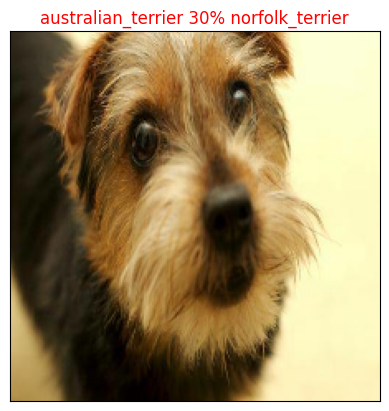

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=88)

Now we've got one fucntion to visualoze our models top prediction, let's make to view our models top 10 predict

This fucntion will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the predcition using get_pred_label()
* Find the top 10:
 * Prediction probabilites indexes
 * Prediction probabilities values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # finr the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

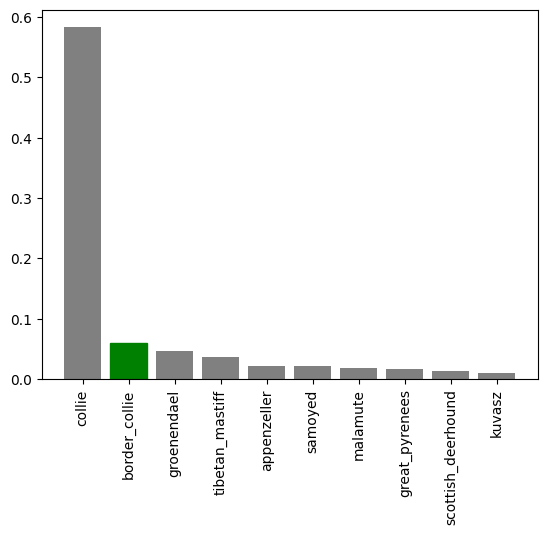

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evalauate our model

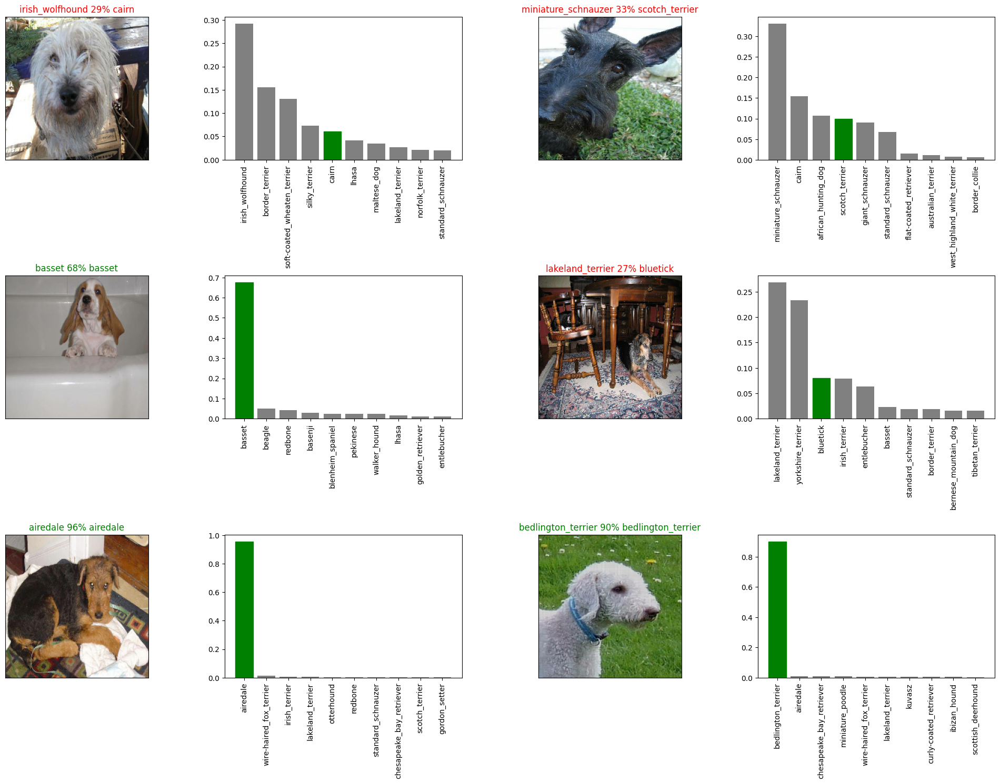

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  saves a given model in models directory and appends a suffix
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Dog-vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load the trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 100 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog-vision/models/20250215-15221739632943-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-vision/models/20250215-15221739632943-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog-vision/models/20250215-15221739632943-1000-images-mobilenetv2-Adam.h5')


Loading saved model from: drive/MyDrive/Dog-vision/models/20250215-15221739632943-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.4040 - accuracy: 0.6500


[1.4039969444274902, 0.6499999761581421]

### Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Create a data batch with the full data batches
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note**: Runnig the cell below will take a little while (may be 30min)

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2078s 6s/step - loss: 1.3482 - accuracy: 0.6602
Epoch 2/100
320/320 [==============================] - 420s 1s/step - loss: 0.4006 - accuracy: 0.8824
Epoch 3/100
320/320 [==============================] - 420s 1s/step - loss: 0.2372 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 422s 1s/step - loss: 0.1540 - accuracy: 0.9619
Epoch 5/100
320/320 [==============================] - 418s 1s/step - loss: 0.1072 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 421s 1s/step - loss: 0.0767 - accuracy: 0.9878
Epoch 7/100
320/320 [==============================] - 422s 1s/step - loss: 0.0586 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 412s 1s/step - loss: 0.0460 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 411s 1s/step - loss: 0.0374 - accuracy: 0.9949
Epoch 10/100
320/320 [==============================] - 412s 1s/step - loss: 0.02

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog-vision/models/20250219-16461739983610-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-vision/models/20250219-16461739983610-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
import tensorflow as tf
from tensorflow import keras

### Loading a saved model

In [ ]:
full_loaded_model = load_model('drive/MyDrive/Dog-vision/models/20250219-16461739983610-full-image-set-mobilenetv2-Adam.h5')


Loading saved model from: drive/MyDrive/Dog-vision/models/20250219-16461739983610-full-image-set-mobilenetv2-Adam.h5


### Making predictions on test images

Since our model has been trained on images in the orm of Tensor batches, to make prediction on the test data, we'll have to get it into same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches

To make predictions on the test data , we'll:

* Get the test image filenames

* Convert the filnames into test data batches using create_data_batches() and setting the 'test_dataparameter toTrue` (since the test data does'nt have labesl.

* Make a predcitions array passing thr batches to the predict() method called on model

In [ ]:
# Load the test image filenames
test_path = 'drive/MyDrive/Dog-vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-vision/test/e64b53f9c0fefdd97e269c55335418e7.jpg',
 'drive/MyDrive/Dog-vision/test/deaef21699dae3945a79dcb820b2a980.jpg',
 'drive/MyDrive/Dog-vision/test/deed28298a869f87cf0372f592a21d43.jpg',
 'drive/MyDrive/Dog-vision/test/e1e79b3edfb3579e46ad914bf755dbbc.jpg',
 'drive/MyDrive/Dog-vision/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg',
 'drive/MyDrive/Dog-vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/Dog-vision/test/e6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 'drive/MyDrive/Dog-vision/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/MyDrive/Dog-vision/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 'drive/MyDrive/Dog-vision/test/e50319e7efc447bb684fbfdbed3ff041.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE**: Calling predict() on our full model and passing it the test data batch will take a long time to run

In [ ]:
# MAke predictions  on test data bathc using the loaded_full_model
test_prediction = full_loaded_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 2055s 6s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('drive/MyDrive/Dog-vision/preds_array_csv', test_prediction, delimiter=',')

In [ ]:
# Load predictions (Numoy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog-vision/preds_array_csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[9.26817378e-09, 1.10508533e-10, 2.18838636e-08, ...,
        2.78211640e-08, 3.71887339e-08, 7.13848010e-07],
       [4.32798762e-13, 1.18916432e-07, 5.37857085e-12, ...,
        1.96464756e-03, 1.44619596e-08, 9.24766130e-09],
       [3.32007687e-07, 6.45546106e-06, 3.04141885e-11, ...,
        7.40794370e-10, 2.08466203e-10, 1.88332353e-11],
       ...,
       [8.68401706e-09, 7.20429989e-06, 3.48596325e-11, ...,
        1.17730331e-11, 2.82204593e-10, 2.76158346e-10],
       [2.15929896e-09, 1.85728902e-06, 1.21234905e-07, ...,
        1.56106310e-08, 8.78458528e-10, 2.54167662e-05],
       [1.11730658e-09, 3.25958115e-11, 3.97362321e-08, ...,
        2.57150674e-08, 4.01037852e-07, 1.57313025e-08]])

### Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission , we find that it wants our models prediction probabaility outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns
Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
['id'] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
import pandas as pd
# Create a pandas DataFrame with empty columns
pred_df = pd.DataFrame(columns=['id'] + list(unique_breeds))

In [ ]:
pred_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df['id'] = test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog-vision/test/e64b53f9c0fefdd97e269c55335418e7', '.jpg')

In [ ]:
pred_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e64b53f9c0fefdd97e269c55335418e7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,deaef21699dae3945a79dcb820b2a980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,deed28298a869f87cf0372f592a21d43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1e79b3edfb3579e46ad914bf755dbbc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e089aa32bc96c2a9753e7a5fcdc1bac9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e64b53f9c0fefdd97e269c55335418e7,9.268174e-09,1.105085e-10,2.188386e-08,1.533875e-11,1.503288e-06,8.556721e-07,1.586145e-07,9.981666e-01,2.496189e-09,...,3.147276e-06,2.307802e-04,1.807098e-08,4.585191e-09,3.897887e-09,8.288628e-09,1.621281e-08,2.782116e-08,3.718873e-08,7.138480e-07
1,deaef21699dae3945a79dcb820b2a980,4.327988e-13,1.189164e-07,5.378571e-12,1.205001e-14,8.329389e-10,2.646768e-08,6.758990e-12,5.885932e-10,5.673296e-10,...,1.291646e-11,3.552302e-11,3.680347e-12,9.076136e-08,3.421493e-10,1.306825e-07,1.157662e-12,1.964648e-03,1.446196e-08,9.247661e-09
2,deed28298a869f87cf0372f592a21d43,3.320077e-07,6.455461e-06,3.041419e-11,1.974604e-09,1.532979e-09,1.093636e-06,6.901880e-07,4.682950e-06,1.876997e-08,...,7.697455e-08,2.354970e-10,2.754163e-11,3.520858e-09,2.018572e-09,3.709324e-07,2.006242e-10,7.407944e-10,2.084662e-10,1.883324e-11
3,e1e79b3edfb3579e46ad914bf755dbbc,3.415755e-09,1.168863e-13,1.300964e-07,1.861580e-11,1.149914e-07,7.392068e-05,2.383037e-08,3.337280e-02,3.442095e-11,...,1.509899e-07,6.294194e-01,5.608343e-10,7.996294e-10,7.286908e-09,1.719527e-08,4.214499e-06,8.414560e-10,8.548017e-08,2.009696e-06
4,e089aa32bc96c2a9753e7a5fcdc1bac9,2.132278e-10,6.673398e-09,3.665398e-10,1.929324e-10,7.197142e-11,1.427600e-08,5.551706e-11,1.651811e-12,2.534846e-12,...,1.056495e-13,1.129390e-10,4.646939e-11,2.261878e-09,2.265331e-09,3.923230e-13,4.716278e-10,2.119790e-05,2.432030e-08,5.916287e-12


In [ ]:
# Save our predictions dataframe to csv for submission to Kaggle
pred_df.to_csv('drive/MyDrive/Dog-vision/full_model_predictions_submission_1_mobilev2.csv',
               index=False)

### Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probablities to predictions label
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image filepaths
custom_path = 'drive/MyDrive/Dog-vision/Dog photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths


['drive/MyDrive/Dog-vision/Dog photos/images.jpg',
 'drive/MyDrive/Dog-vision/Dog photos/photo_1.jpg',
 'drive/MyDrive/Dog-vision/Dog photos/photo_2.jpg',
 'drive/MyDrive/Dog-vision/Dog photos/photo_3.jpg']

In [ ]:
# Turn custom images into data batches
custom_data  = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = full_loaded_model.predict(custom_data)


1/1 [==============================] - 0s 151ms/step


In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['bull_mastiff', 'leonberg', 'toy_poodle', 'doberman']

In [ ]:
# Get custom images (batchify() won't work bcoz  there are no labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

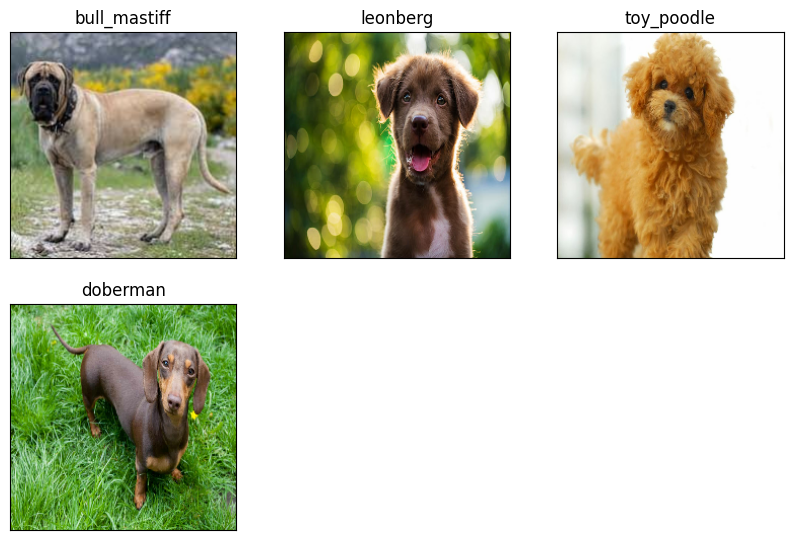

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  ax = plt.subplot(3,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)